# Homework 2 BMENE 3340

Download normalized single-cell gene expression data for ~6K PBMCs (peripheral blood cells)
from a healthy donor from here. Note the data is already filtered and contains
only the 500 most variable genes. Rows and columns represent genes and cell IDs respectively.

## Sources: 
Q1: 
* https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html
* https://en.wikipedia.org/wiki/Radius_of_curvature
* https://www.kite.com/python/answers/how-to-delete-a-line-from-a-file-in-python#:~:text=Use%20del%20to%20delete%20a,delete%20the%20element%20at%20index%20.
* https://umap-learn.readthedocs.io/en/latest/parameters.html
* https://scanpy-tutorials.readthedocs.io/en/latest/plotting/core.html

Q2: https://nbisweden.github.io/workshop-scRNAseq/labs/compiled/scanpy/scanpy_04_clustering.html

Q3: https://stackabuse.com/k-nearest-neighbors-algorithm-in-python-and-scikit-learn/

Q4: Louvain:
* https://nbisweden.github.io/workshop-scRNAseq/labs/compiled/scanpy/scanpy_04_clustering.html https://github.com/theislab/scanpy/issues/1283 

Knn graph: 
* https://www.kaggle.com/shrutimechlearn/step-by-step-diabetes-classification-knn-detailed

Q5:
* https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

Collaborators: Chinyere Ihuegbu, Tony Fischetti, TA hours, office hours, class notes, cited papers in lecture

In [1]:
# Load the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import math
import scipy
from scipy import sparse
import scipy.io
from scipy.io import mmread
import scanpy as sc
import umap as UMAP

import seaborn as sns

from sklearn.manifold import TSNE
from sklearn.linear_model import LinearRegression

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.22.1 statsmodels==0.11.0 python-igraph==0.8.2 louvain==0.7.0 leidenalg==0.8.2


In [3]:
sc.set_figure_params(dpi=100, color_map = 'viridis_r')
sc.settings.verbosity = 1
sc.logging.print_versions()

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 7.0.0
anndata             0.7.4
appnope             0.1.0
backcall            0.1.0
bottleneck          1.3.2
cffi                1.14.0
cloudpickle         1.3.0
colorama            0.4.3
cycler              0.10.0
cython_runtime      NA
cytoolz             0.10.1
dask                2.11.0
dateutil            2.8.1
decorator           4.4.1
get_version         2.1
h5py                2.10.0
igraph              0.8.2
importlib_metadata  1.5.0
ipykernel           5.1.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.14.1
joblib              0.14.1
kiwisolver          1.1.0
legacy_api_wrap     1.2
leidenalg           0.8.2
llvmlite            0.31.0
louvain             0.7.0
matplotlib          3.1.3
mkl                 2.3.0
mpl_toolkits        NA
natsort             7.0.1
numba               0.48.0
numexpr             2.7.1
numpy               1.18.1
packaging           20.1

a_file = open("pbmc_6Kcells_500genes.txt", "r")
lines = a_file.readlines()
a_file.close()

del lines[0]

new_file=open("pbmc_6Kcells_500genes.txt", "w+")

for line in lines:
    new_file.write(line)
    
new_file.close()

# load the data
adata = sc.read(
    'pbmc_6Kcells_500genes.txt',
    var_names = 'gene_symbols', 
    cache=True)

# Load the data
pbmc_6k = np.genfromtxt(fname='pbmc_6Kcells_500genes.txt')
print(pbmc_6k) # this is the numpy data
pbmc_6k.shape
# mad zeroes when I visually inspect the data

# before I create the df, i need to tell what's columns and what's rows 
genes = ['gene_' + str(i) for i in range(1,pbmc_6k.shape[0]+1)]
cell_ids = ['cell_' + str(i) for i in range(1,pbmc_6k.shape[1]+1)]
# genes = range(1,pbmc_6k.shape[0]+1)
# cell_ids = range(1,pbmc_6k.shape[1]+1)

# turn into pandas df
pbmc6k_df = pd.DataFrame(data=pbmc_6k,index=genes, columns=cell_ids)
pbmc6k_df.head()

# Q1a. Normalize the data by scaling to median library size and log transform the normalized data and perform PCA,followed by t-SNE or UMAP on the top 20 PCs. Plot the 2D embedding [15pt]. 

#with open("tmp.txt", "w") as fout:
 #   with open("pbmc_6Kcells_500genes.txt", "r") as fin:
 #       for linenum, theline in enumerate(fin.readlines()):
 #           if linenum == 0:
 #               continue
 #           fout.write(theline)

In [4]:
# load the data
adata = sc.read_text('pbmc_6Kcells_500genes.txt', delimiter="\t", first_column_names=True).transpose()

In [5]:
adata.var_names_make_unique() 

In [6]:
# inspect contents
adata


AnnData object with n_obs × n_vars = 6825 × 500

In [7]:
print(adata.var_names)

Index(['A1BG', 'A1BG-AS1', 'A2M-AS1', 'AAMDC', 'AAR2', 'AARD', 'AARS',
       'AARSD1', 'AASDH', 'AASDHPPT',
       ...
       'VAMP2', 'VAMP8', 'VCAN', 'VIM', 'XBP1', 'YBX1', 'ZFAS1', 'ZFP36',
       'ZFP36L1', 'ZFP36L2'],
      dtype='object', length=500)


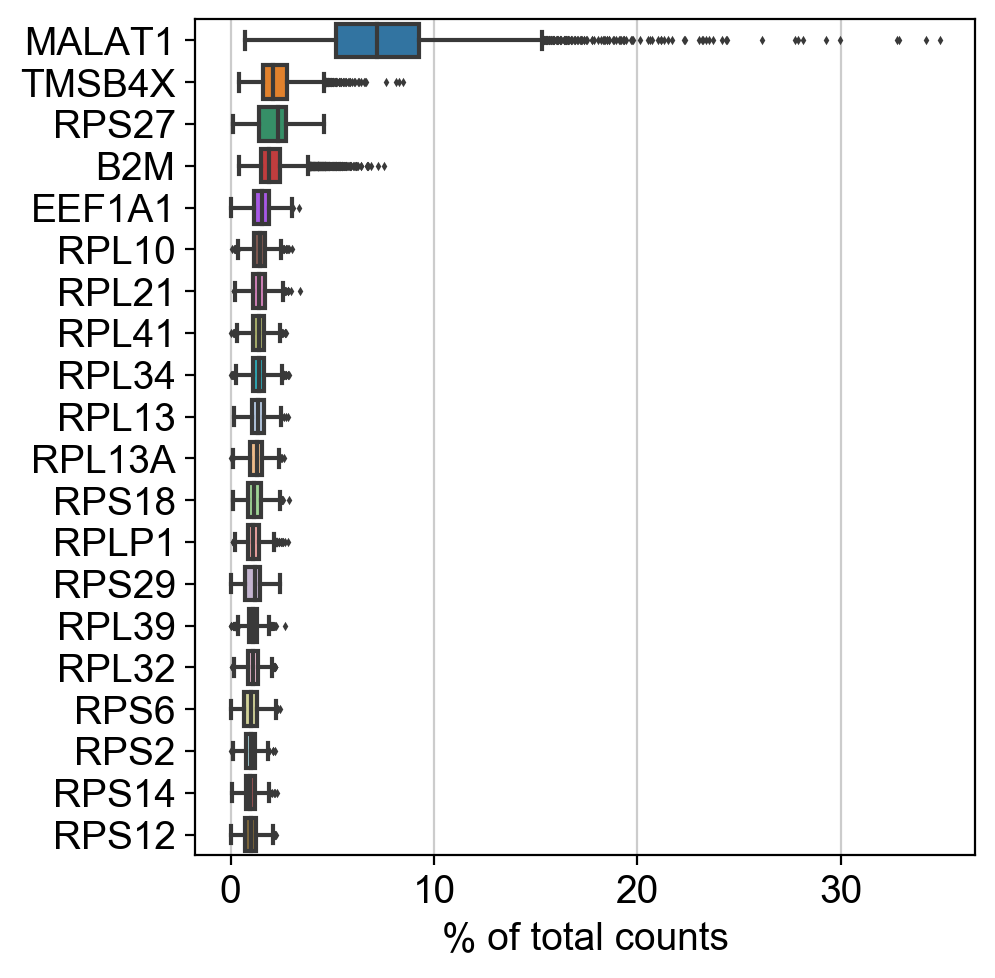

In [8]:
# Show those genes that yield the highest fraction of counts in each single cells, across all cells.
sc.pl.highest_expr_genes(adata, n_top=20, )

MALAT1 = Metastasis Associated Lung Adenocarcinoma Transcript 1, upregulation in multiple CA
TMSB4X = Thymosin Beta 4 Xlinked, role in regulation of actin polymerization, cell proliferation, migration and differentiation.
RPS27 = Ribosomal Protein 27, elevated expression associated with CA
B2M = Beta-2-Microglobulin, mutation in this gene may result in hypercatabolic hyperproteinemia
EEF1A1 = Eukaryotic Translation Elongation Factor 1 Alpha 1, a/w enzymatic delivery of aminoacyl tRNAs, everywhere 
RPS6 = upreg a/w tumor promoting agents; others not interesting
RPLs= not interesting

In [11]:
# Data is already filtered per instructions

sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [12]:
# Q1a. Normalize the filtered data
sc.pp.normalize_total(adata, target_sum=1e4, exclude_highly_expressed=False, max_fraction=0.05, key_added=None, layers=None, layer_norm=None, inplace=True) 

In [13]:
# Q1a. log transform the data
sc.pp.log1p(adata)

In [14]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

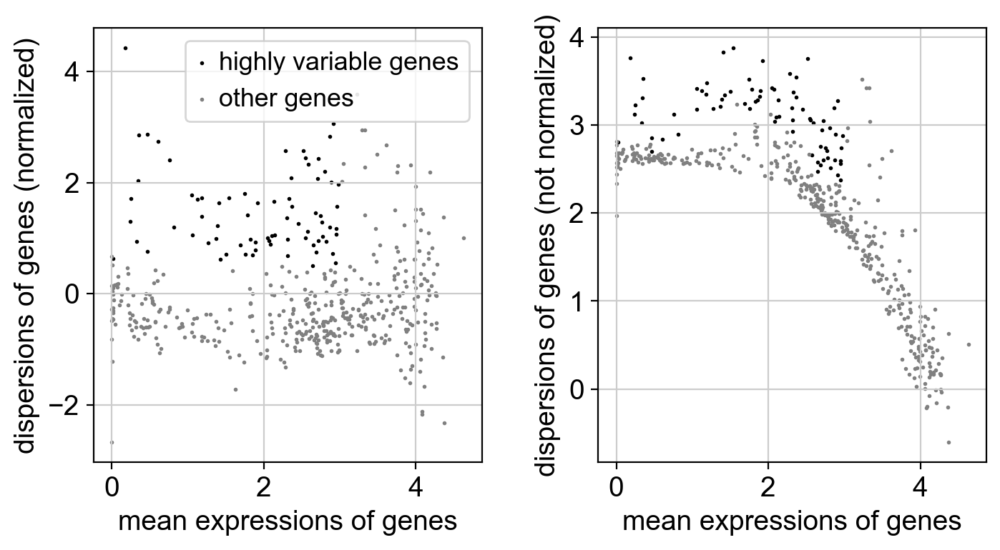

In [15]:
sc.pl.highly_variable_genes(adata)

In [16]:
# QC check
adata.X

array([[0.       , 0.       , 0.       , ..., 3.3633504, 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 2.4827132, 2.4827132,
        2.4827132],
       [0.       , 0.       , 0.       , ..., 2.8859887, 2.8859887,
        3.4120917],
       ...,
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        3.3677456],
       [3.1996348, 0.       , 3.1996348, ..., 0.       , 2.3218558,
        3.0381136],
       [0.       , 0.       , 0.       , ..., 3.1066349, 0.       ,
        3.8523824]], dtype=float32)

In [17]:
# QC check
sc.get.obs_df(adata, keys=(), obsm_keys=(), layer=None, gene_symbols=None, use_raw=False)

""
0
1
2
3
4
...
6820
6821
6822
6823


In [18]:
# QC check
sc.get.var_df(adata, keys=(), varm_keys=(), layer=None)

""
A1BG
A1BG-AS1
A2M-AS1
AAMDC
AAR2
...
YBX1
ZFAS1
ZFP36
ZFP36L1


adata = adata[:, adata.var.highly_variable]

sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

sc.pp.scale(adata, max_value=10)

In [19]:
# QC check
adata

AnnData object with n_obs × n_vars = 6825 × 500
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [20]:
# Perform principal component analysis
sc.tl.pca(adata, svd_solver='arpack')

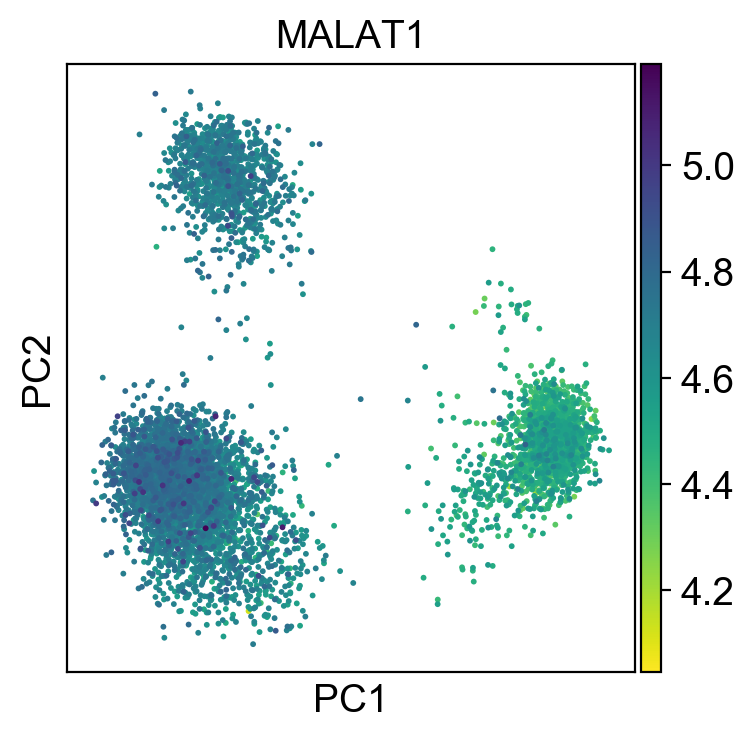

In [21]:
#rcParams['figure.figsize'] = 4, 4
sc.pl.pca(adata, color='MALAT1')       # Should I be choosing a different one to color?

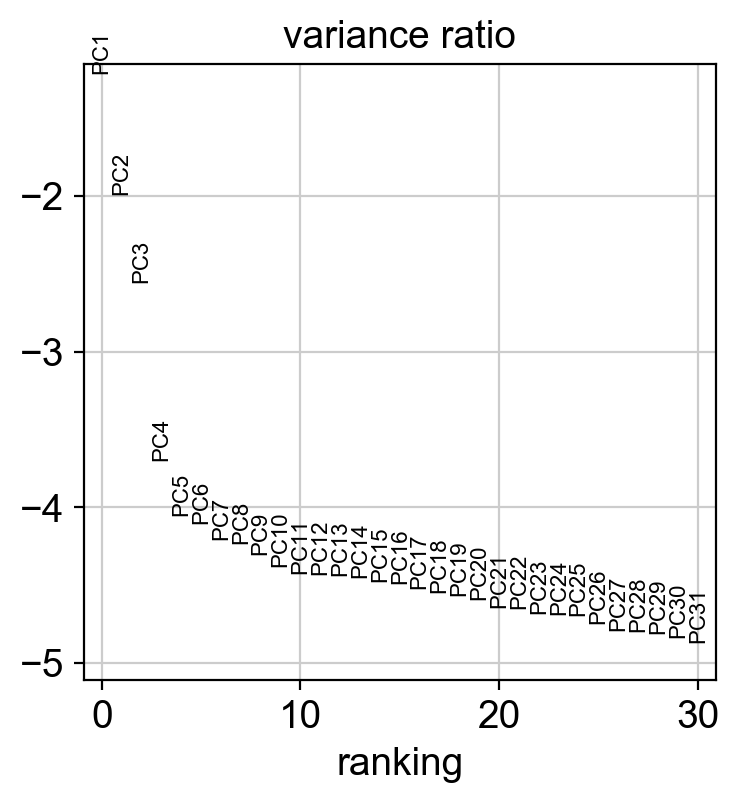

In [22]:
sc.pl.pca_variance_ratio(adata, log=True)

In [23]:
# QC check
adata   # I don't have the gene ids here, will add them later in the notebook

AnnData object with n_obs × n_vars = 6825 × 500
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [24]:
# Ok, let's look at 20 pcs with UMAP
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

In [25]:
# UMAP embedding
sc.tl.umap(adata)

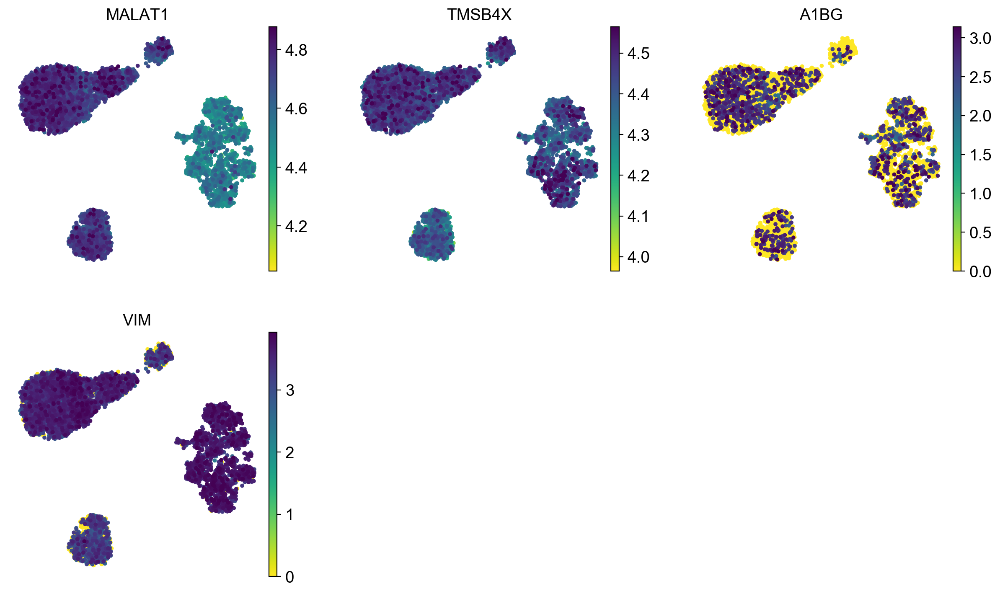

In [27]:
rcParams['figure.figsize'] = 4, 4
sc.pl.umap(adata, color=['MALAT1', 'TMSB4X', 'A1BG', 'VIM'], s=50, frameon=False, ncols=3, vmax='p99') #top 2 expressed and exploring from vars listed

In [28]:
# Running Leiden clustering
sc.tl.leiden(adata) # found 8 clusters

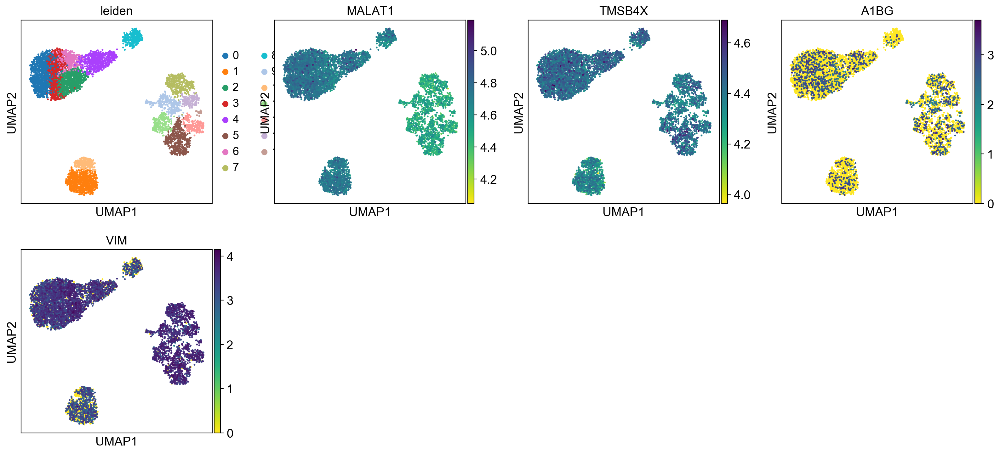

In [30]:
# Plot the clusters
sc.pl.umap(adata, color=['leiden', 'MALAT1', 'TMSB4X', 'A1BG', 'VIM'])


# Visualising UMAP in 3d
# How do I do this??
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reducer.embedding_[:, 0], reducer.embedding_[:, 1],reducer.embedding_[:, 2], c=y, cmap='gist_rainbow')
ax.set_xlabel('umap_1')
ax.set_ylabel('umap_2')
ax.set_zlabel('umap_3')
plt.title('Visualizing gene expression through UMAP in 3D', fontsize=24);
plt.show()

## Q1b. Is 20 a good choice for the number of PCs? [bonus 5 pt]

* The cluster on the bottom, does this indicate poor filtering regarding library size? Is there too much overlap and do we need to account for batch effect?  What if we drop the PCs to 15?

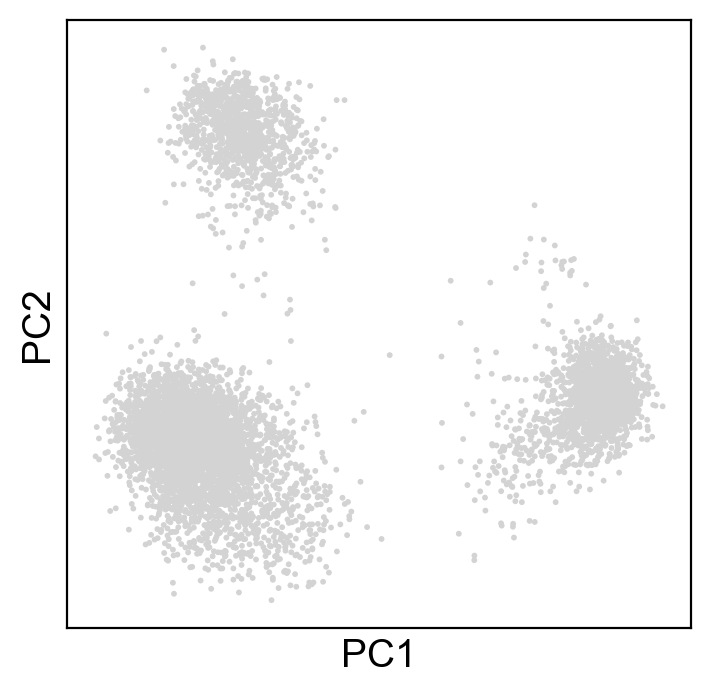

/Users/kathrynwhyte/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/kathrynwhyte/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:176: RuntimeWarning: Glyph 8942 missing from current font.
  font.load_char(ord(s), flags=flags)


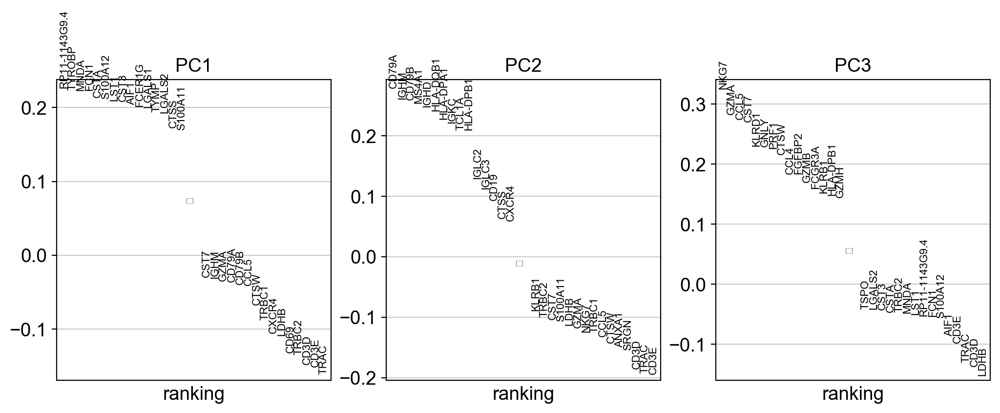

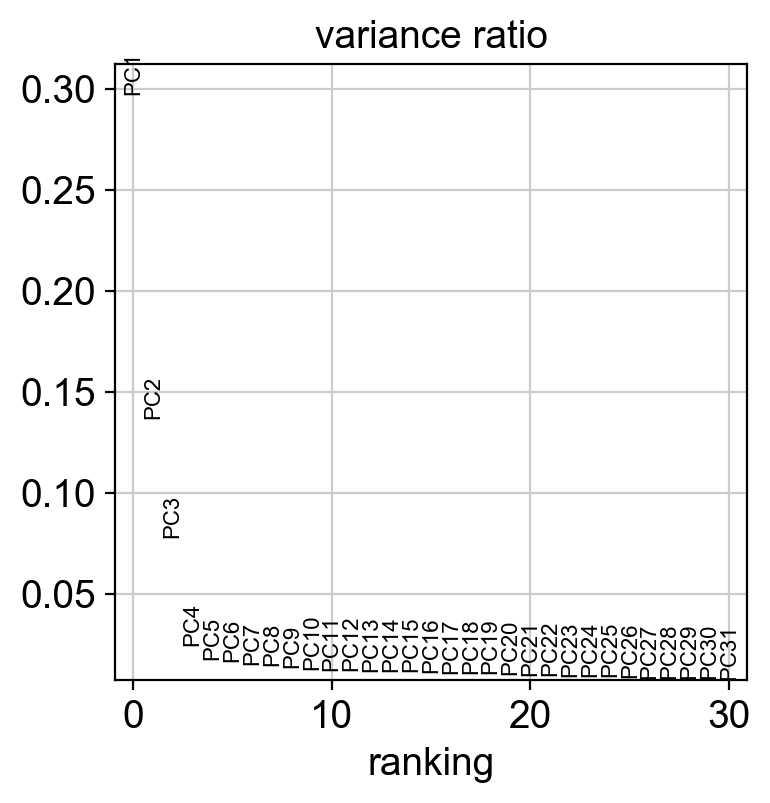

In [39]:
# plot the top 2 PCs
sc.pl.pca_overview(adata)

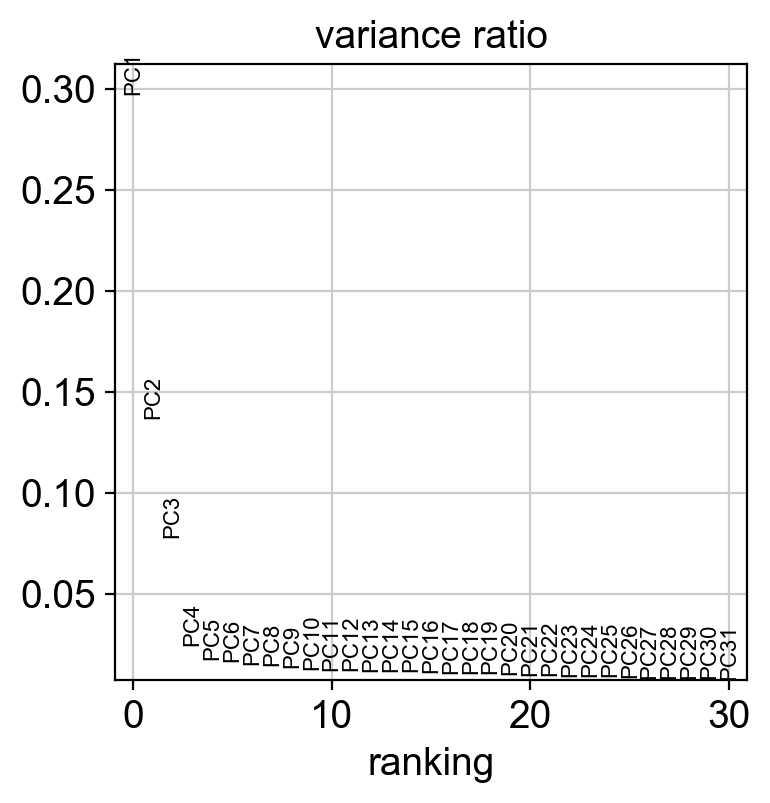

In [43]:
# Visualize the top genes
sc.pl.pca_variance_ratio(adata)

In [31]:
# Here's 15 PCs
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15)

In [32]:
sc.tl.umap(adata)

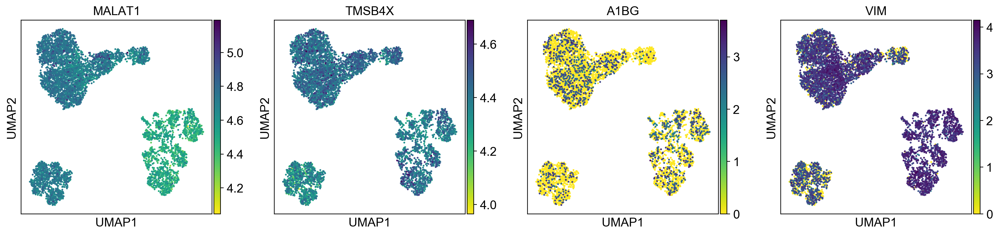

In [33]:
sc.pl.umap(adata, color=['MALAT1', 'TMSB4X', 'A1BG', 'VIM']) 

In [34]:
sc.tl.leiden(adata) 

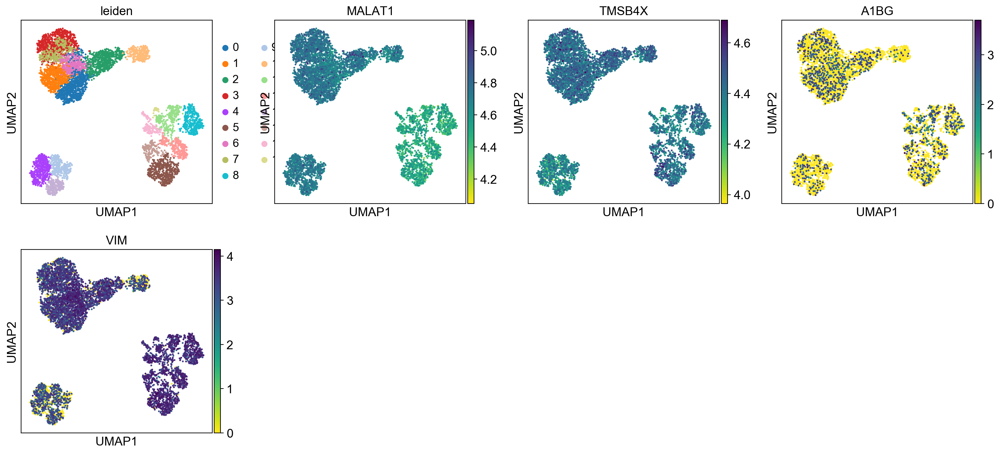

In [35]:
sc.pl.umap(adata, color=['leiden', 'MALAT1', 'TMSB4X', 'A1BG', 'VIM']) 

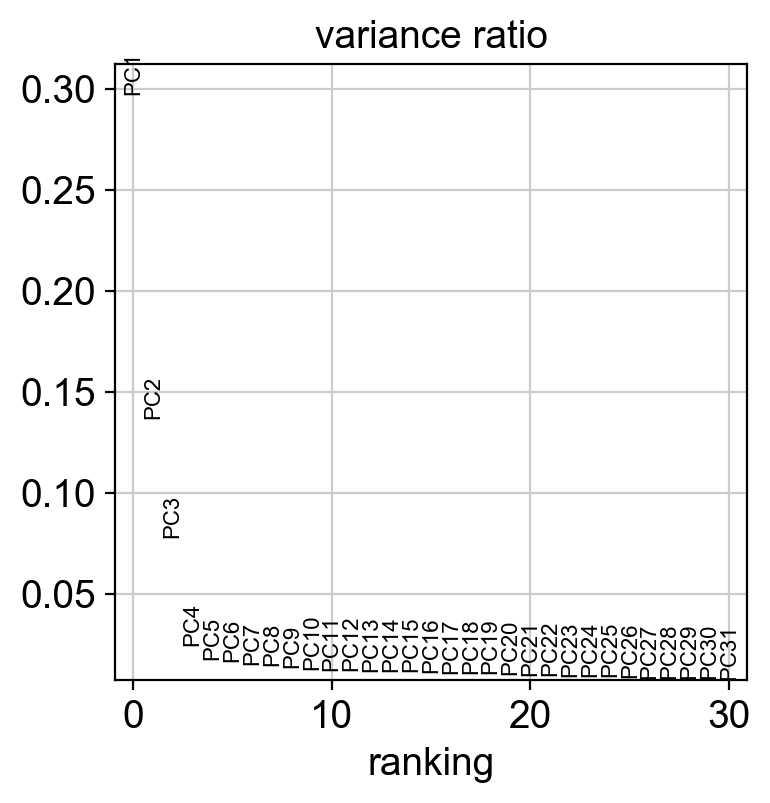

In [44]:
sc.pl.pca_variance_ratio(adata)

## Q1b.  Looking at the elbow plots comparing 20 to 15 PCs, the precentage of variance did not drop that much, 20 PCs seems like a reasonable choice.

In [36]:
adata

AnnData object with n_obs × n_vars = 6825 × 500
    obs: 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## Q2. Cluster cells using the K-means method and color the embedding from Q1 with cluster IDs. Justify your choice of K [20 pts].

In [45]:
# Comparing Leiden 
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

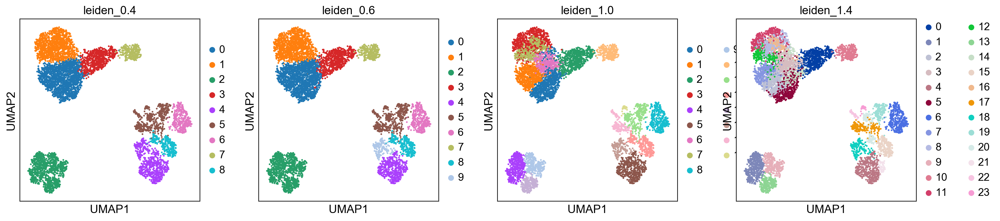

In [46]:
sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'])

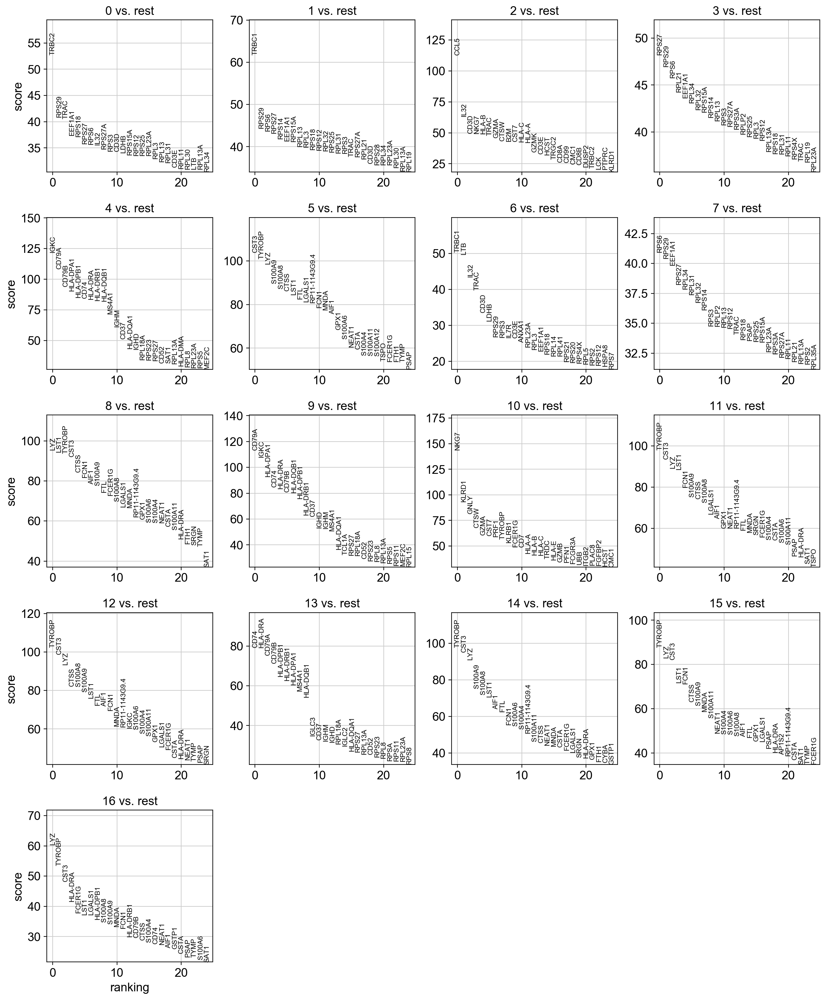

In [48]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [49]:
# Change the data into a dataframe
de_genes = pd.DataFrame(adata.uns['rank_genes_groups']['names'])

In [50]:
de_genes.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,TRBC2,TRBC1,CCL5,RPS27,IGKC,CST3,TRBC1,RPS6,LYZ,CD79A,NKG7,TYROBP,TYROBP,CD74,TYROBP,TYROBP,LYZ
1,RPS29,RPS29,IL32,RPS29,CD79A,TYROBP,LTB,RPS29,LST1,IGKC,KLRD1,CST3,CST3,HLA-DRA,CST3,LYZ,TYROBP
2,TRAC,RPS6,CD3D,RPS6,CD79B,LYZ,IL32,EEF1A1,TYROBP,HLA-DPA1,GNLY,LYZ,LYZ,CD79A,LYZ,CST3,CST3
3,EEF1A1,RPS27,NKG7,RPL21,HLA-DPA1,S100A9,TRAC,RPS27,CST3,CD74,CTSW,LST1,CTSS,CD79B,S100A9,LST1,HLA-DRA
4,RPS18,RPS14,HLA-B,EEF1A1,HLA-DPB1,S100A8,CD3D,RPL34,CTSS,HLA-DRA,GZMA,FCN1,S100A8,HLA-DPB1,S100A8,FCN1,FCER1G
5,RPS27,EEF1A1,TRAC,RPL34,CD74,CTSS,LDHB,RPL31,FCN1,CD79B,CST7,S100A9,S100A9,HLA-DRB1,LST1,CTSS,LST1
6,RPS6,RPS15A,GZMA,RPL32,HLA-DRA,LST1,RPS29,RPL32,AIF1,HLA-DQB1,PRF1,CTSS,LST1,HLA-DPA1,AIF1,S100A9,LGALS1
7,IL32,RPL13,CTSW,RPS15A,HLA-DRB1,FTL,RPS3,RPS14,S100A9,HLA-DPB1,TYROBP,S100A8,FTL,MS4A1,FTL,MNDA,HLA-DPB1
8,RPS27A,RPL3,B2M,RPS14,HLA-DQB1,LGALS1,IL7R,RPS3,FTL,HLA-DRB1,KLRB1,LGALS1,AIF1,HLA-DQB1,FCN1,S100A11,S100A8
9,RPS3,RPS18,CST7,RPL13,MS4A1,RP11-1143G9.4,CD3E,RPLP2,FCER1G,CD37,FCER1G,AIF1,FCN1,IGLC3,S100A6,NEAT1,S100A9


In [51]:
sc.tl.dendrogram(adata, groupby = "leiden_1.0")

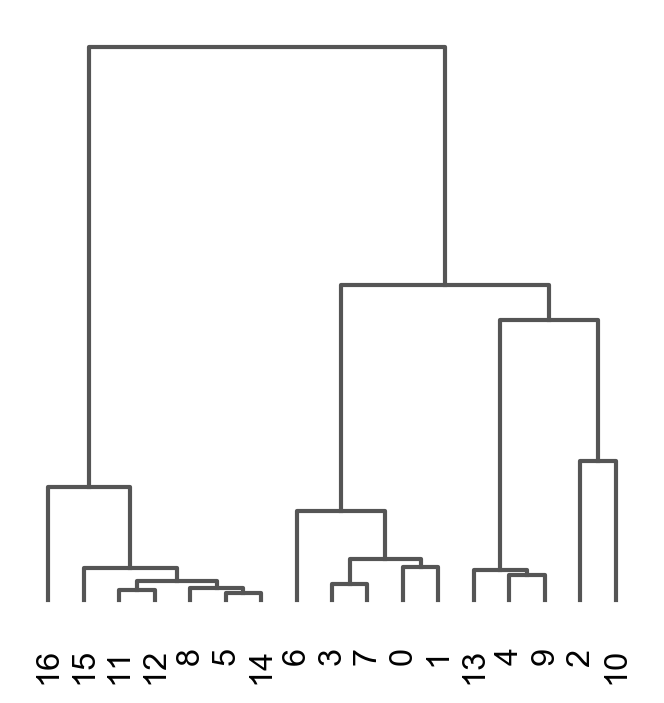

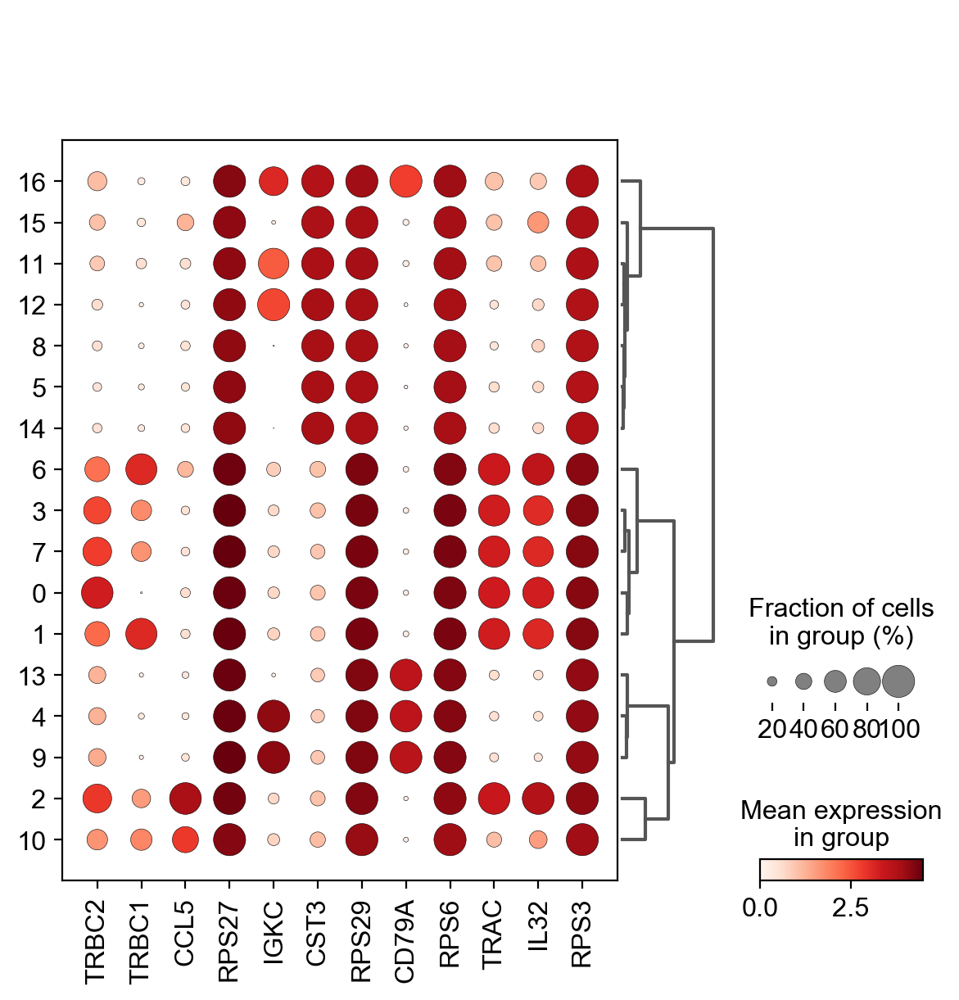

In [52]:
sc.pl.dendrogram(adata, groupby = "leiden_1.0")

genes  = ["TRBC2", "TRBC1", "CCL5", "RPS27","IGKC", "CST3","RPS29","CD79A","RPS6","TRAC","IL32","RPS3"]
sc.pl.dotplot(adata, genes, groupby='leiden_1.0', dendrogram=True)

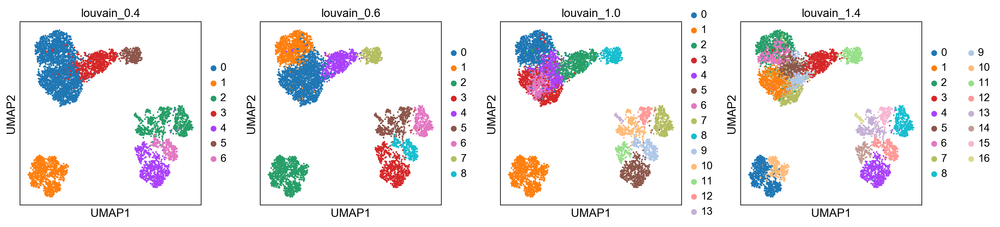

In [53]:
# To Louvain
sc.tl.louvain(adata, key_added = "louvain_1.0") # default resolution in 1.0
sc.tl.louvain(adata, resolution = 0.6, key_added = "louvain_0.6")
sc.tl.louvain(adata, resolution = 0.4, key_added = "louvain_0.4")
sc.tl.louvain(adata, resolution = 1.4, key_added = "louvain_1.4")

sc.pl.umap(adata, color=['louvain_0.4', 'louvain_0.6', 'louvain_1.0','louvain_1.4'])

In [54]:
sc.tl.dendrogram(adata, groupby = "louvain_1.0")


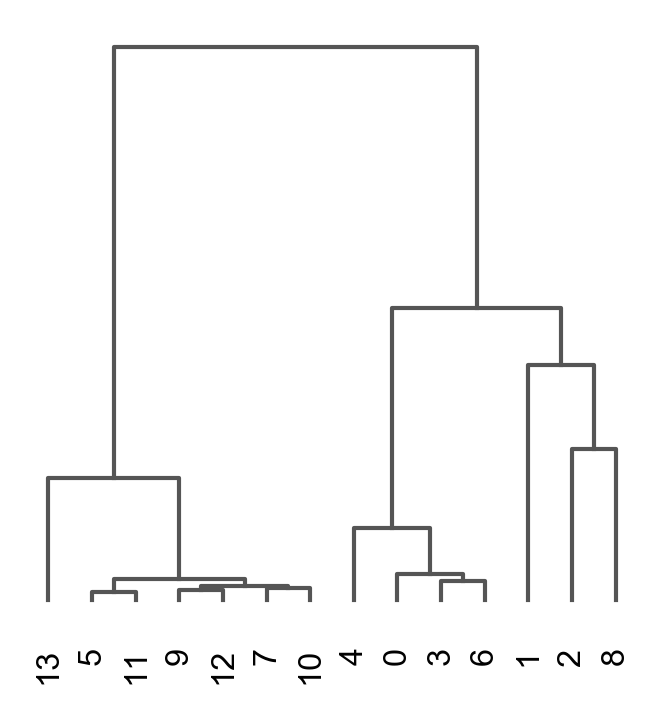

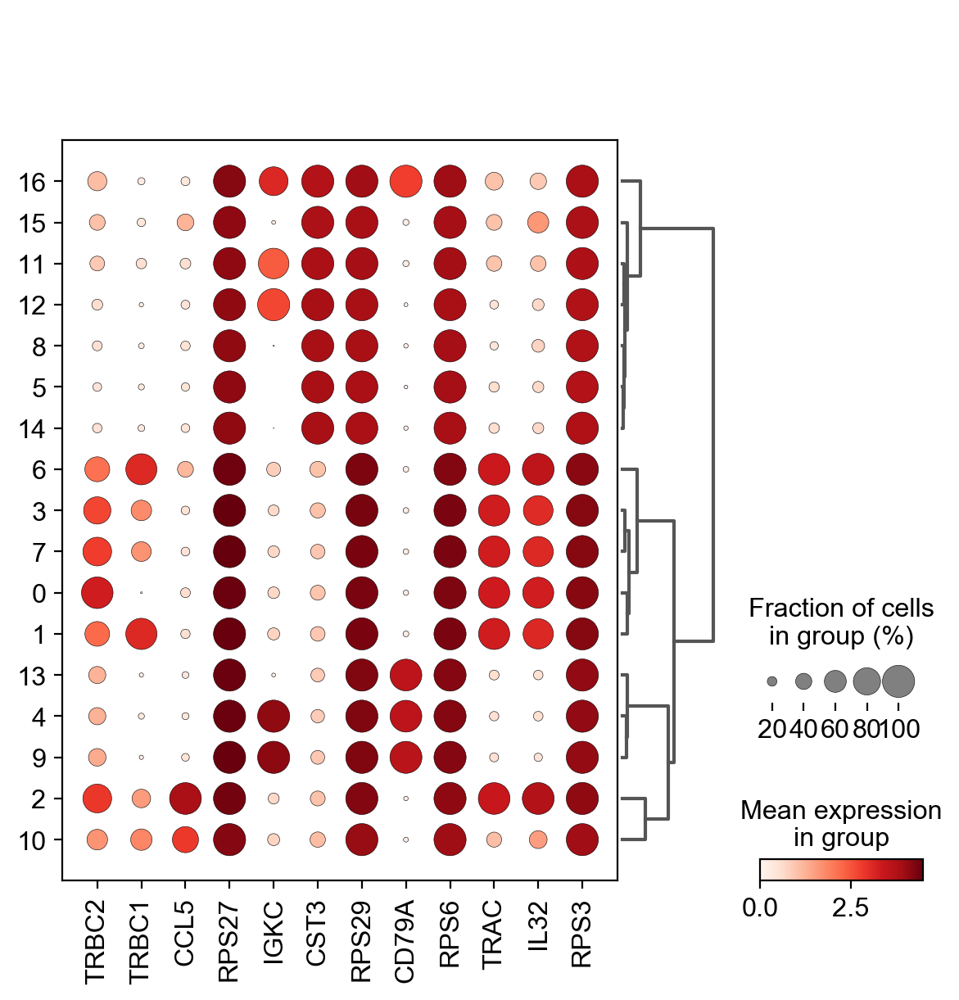

In [55]:
sc.pl.dendrogram(adata, groupby = "louvain_1.0")

genes  = ["TRBC2", "TRBC1", "CCL5", "RPS27","IGKC", "CST3","RPS29","CD79A","RPS6","TRAC","IL32","RPS3"]
sc.pl.dotplot(adata, genes, groupby='leiden_1.0', dendrogram=True)

# K-means 

In [ ]:
# Color the embedding from Q1 with cluster IDs
sc.pl.umap(adata, color=['kmeans5', 'kmeans10', 'kmeans15', 'kmeans20'])

In [56]:
# Start k-means 
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# extract pca coordinates
X_pca = adata.obsm['X_pca'] 

# kmeans with k=5
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_pca) 
adata.obs['kmeans5'] = kmeans.labels_.astype(str)

# kmeans with k=10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_pca) 
adata.obs['kmeans10'] = kmeans.labels_.astype(str)

# kmeans with k=15
kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca) 
adata.obs['kmeans15'] = kmeans.labels_.astype(str)

# kmeans with k=20
kmeans = KMeans(n_clusters=20, random_state=0).fit(X_pca) 
adata.obs['kmeans20'] = kmeans.labels_.astype(str)

... storing 'kmeans5' as categorical
... storing 'kmeans10' as categorical
... storing 'kmeans15' as categorical
... storing 'kmeans20' as categorical
... storing 'hclust_5' as categorical
... storing 'hclust_10' as categorical
... storing 'hclust_15' as categorical


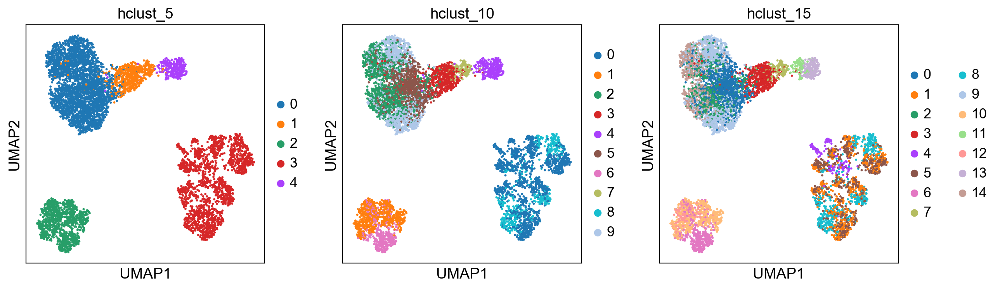

In [57]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
adata.obs['hclust_5'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=10, affinity='euclidean', linkage='ward')
adata.obs['hclust_10'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=15, affinity='euclidean', linkage='ward')
adata.obs['hclust_15'] = cluster.fit_predict(X_pca).astype(str)


sc.pl.umap(adata, color=['hclust_5', 'hclust_10', 'hclust_15'])

# Cluster cells using K-means; start with Leiden clusters
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

# Color the embedding from Q1 with Leiden clusters
sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'])

# Use the dendrogram to look at distances
sc.tl.dendrogram(adata, groupby = "leiden_1.0")
sc.pl.dendrogram(adata, groupby = "leiden_1.0")

genes  = ['MALAT1', 'TMSB4X', 'RPS27', 'B2M', 'EEF1A1', 'RPL10', 'RPL21', 'RPL41', 'RPL34', 'RPL13', 'RPL13A']
sc.pl.dotplot(adata, genes, groupby='leiden_1.0', dendrogram=True)

## Justifying choice of K:
* K means = 20 provided a graphic with more heterogeneity  however this method is sensitive to outliers and this I may wish to filter the data further and re run the kmeans=20

In [58]:
adata

AnnData object with n_obs × n_vars = 6825 × 500
    obs: 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'kmeans5', 'kmeans10', 'kmeans15', 'kmeans20', 'hclust_5', 'hclust_10', 'hclust_15'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', "dendrogram_['leiden_1.0']", 'dendrogram_leiden_1.0', 'rank_genes_groups', 'louvain', 'louvain_0.4_colors', 'louvain_0.6_colors', 'louvain_1.0_colors', 'louvain_1.4_colors', "dendrogram_['louvain_1.0']", 'dendrogram_louvain_1.0', 'hclust_5_colors', 'hclust_10_colors', 'hclust_15_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

# Q3. Compute a 30-NN (nearest neighbor) graph between cells. Plot a heatmap of the adjacency matrix for the graph [10 pts]. 

In [59]:
sc.pp.neighbors(adata, n_pcs=20, n_neighbors=30, use_rep=None, knn=True, random_state=0, method='umap', metric='euclidean', metric_kwds={}, key_added=None, copy=False)

In [62]:
sc.Neighbors.connectivities

In [63]:
sc.tl.umap(adata)

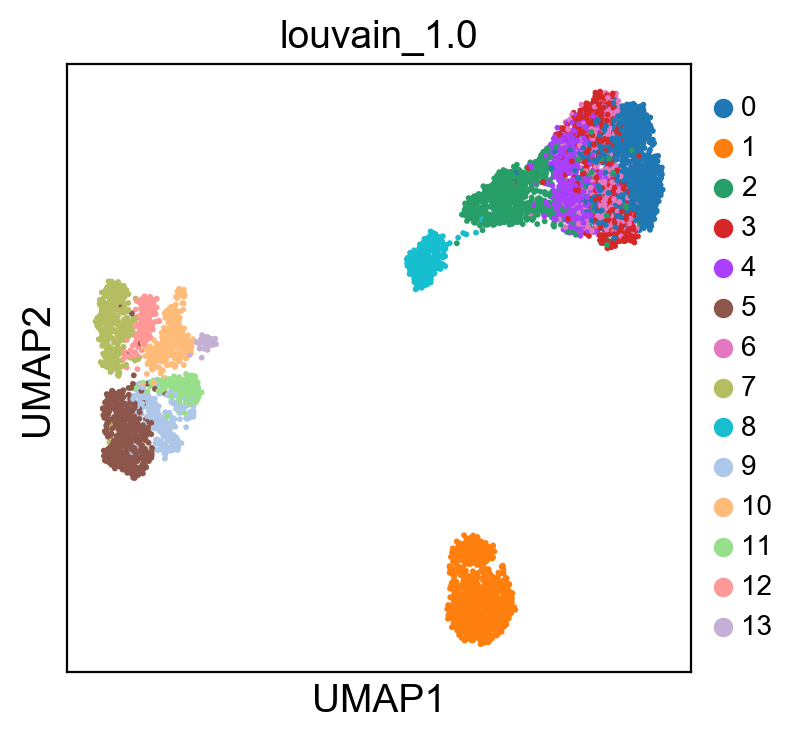

In [65]:
sc.pl.umap(adata, color=['louvain_1.0'], legend_fontsize=10)

# extract pca coordinates
X = adata.obsm['X'] 
Y = adata.obsm['Y']


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=5) # should i change this to 15?  or is this my distance?
classifier.fit(X_train, y_train)

y_pred = classifier.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

In [ ]:
# I don't know how to get this graph in scanpy this is scikitlearn pckg.

error = []

# Calculating error for K values between 1 and 40
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != y_test))


In [ ]:
# plotting the figure from the code above which i realize does not match adata

plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error = [], color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')


In [69]:
adata

AnnData object with n_obs × n_vars = 6825 × 500
    obs: 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'kmeans5', 'kmeans10', 'kmeans15', 'kmeans20', 'hclust_5', 'hclust_10', 'hclust_15'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', "dendrogram_['leiden_1.0']", 'dendrogram_leiden_1.0', 'rank_genes_groups', 'louvain', 'louvain_0.4_colors', 'louvain_0.6_colors', 'louvain_1.0_colors', 'louvain_1.4_colors', "dendrogram_['louvain_1.0']", 'dendrogram_louvain_1.0', 'hclust_5_colors', 'hclust_10_colors', 'hclust_15_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

# Running Louvain
sc.tl.louvain(adata, key_added = "louvain_1.0") # default resolution in 1.0
sc.tl.louvain(adata, resolution = 0.6, key_added = "louvain_0.6")
sc.tl.louvain(adata, resolution = 0.4, key_added = "louvain_0.4")
sc.tl.louvain(adata, resolution = 1.4, key_added = "louvain_1.4")

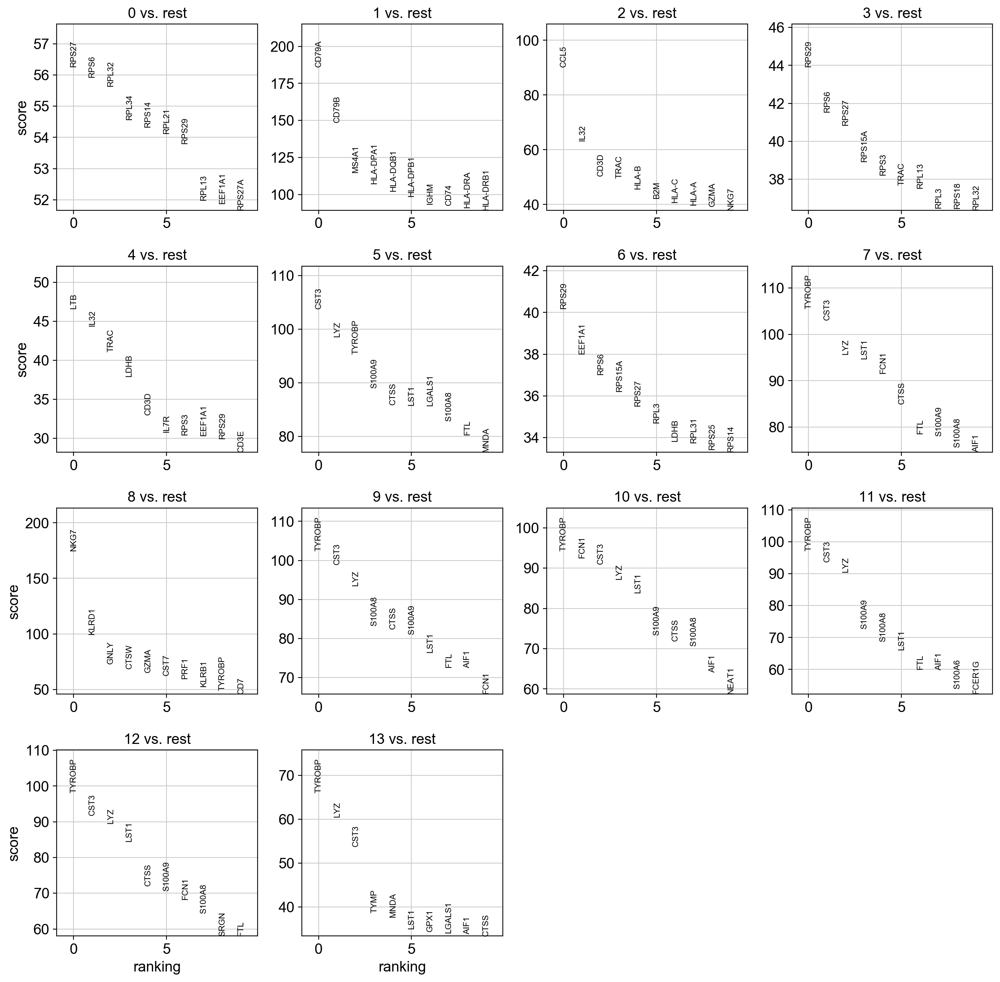

In [71]:
# Perform t-test to DE genes in each cluster
sc.tl.rank_genes_groups(adata, "louvain_1.0", method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)
# how do i see the pvalues

In [72]:
# Select DE genes to plot in Heat map
# Change the data into a dataframe
de_genes = pd.DataFrame(adata.uns['rank_genes_groups']['names'])



In [73]:
# Select the top 5 DE genes for each cluster
top_genes = 5
gene_list = [(de_genes.iloc[:top_genes, cell]).tolist() for cell in range(len(de_genes.columns))]
gene_list = [elem for item in gene_list for elem in item]
len(gene_list)

70

In [74]:
de_genes.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,RPS27,CD79A,CCL5,RPS29,LTB,CST3,RPS29,TYROBP,NKG7,TYROBP,TYROBP,TYROBP,TYROBP,TYROBP
1,RPS6,CD79B,IL32,RPS6,IL32,LYZ,EEF1A1,CST3,KLRD1,CST3,FCN1,CST3,CST3,LYZ
2,RPL32,MS4A1,CD3D,RPS27,TRAC,TYROBP,RPS6,LYZ,GNLY,LYZ,CST3,LYZ,LYZ,CST3
3,RPL34,HLA-DPA1,TRAC,RPS15A,LDHB,S100A9,RPS15A,LST1,CTSW,S100A8,LYZ,S100A9,LST1,TYMP
4,RPS14,HLA-DQB1,HLA-B,RPS3,CD3D,CTSS,RPS27,FCN1,GZMA,CTSS,LST1,S100A8,CTSS,MNDA
5,RPL21,HLA-DPB1,B2M,TRAC,IL7R,LST1,RPL3,CTSS,CST7,S100A9,S100A9,LST1,S100A9,LST1
6,RPS29,IGHM,HLA-C,RPL13,RPS3,LGALS1,LDHB,FTL,PRF1,LST1,CTSS,FTL,FCN1,GPX1
7,RPL13,CD74,HLA-A,RPL3,EEF1A1,S100A8,RPL31,S100A9,KLRB1,FTL,S100A8,AIF1,S100A8,LGALS1
8,EEF1A1,HLA-DRA,GZMA,RPS18,RPS29,FTL,RPS25,S100A8,TYROBP,AIF1,AIF1,S100A6,SRGN,AIF1
9,RPS27A,HLA-DRB1,NKG7,RPL32,CD3E,MNDA,RPS14,AIF1,CD7,FCN1,NEAT1,FCER1G,FTL,CTSS


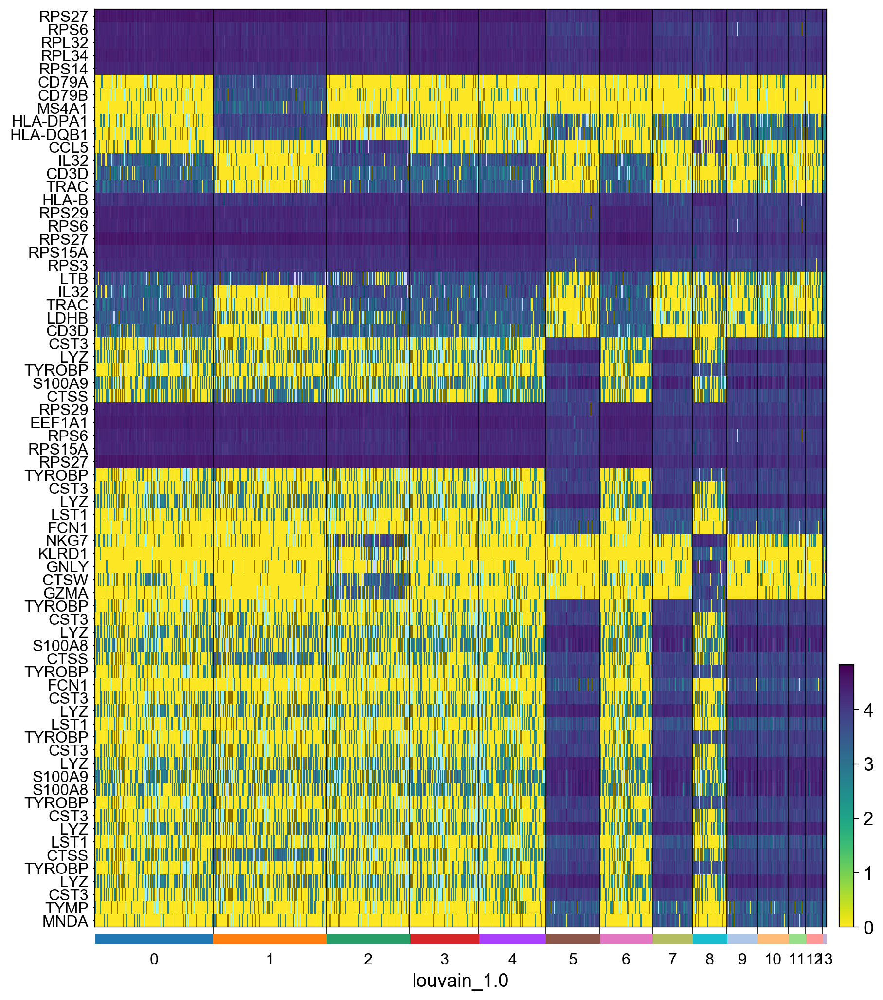

In [76]:
sc.pl.heatmap(adata, var_names = gene_list, groupby='louvain_1.0', 
              var_group_labels=['Cluster 0','Cluster 1','Cluster 2','Cluster 3','Cluster 4','Cluster 5','Cluster 6'
                               'Cluster 7','Cluster 8','Cluster 9','Cluster 10'],
             show_gene_labels=True, swap_axes=True)

## Q3a. Justify your distance metric [bonus 5 pts].

* Used euclidean distances, robust to issues with filter, and supported by literature

In [77]:
adata

AnnData object with n_obs × n_vars = 6825 × 500
    obs: 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'kmeans5', 'kmeans10', 'kmeans15', 'kmeans20', 'hclust_5', 'hclust_10', 'hclust_15'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', "dendrogram_['leiden_1.0']", 'dendrogram_leiden_1.0', 'rank_genes_groups', 'louvain', 'louvain_0.4_colors', 'louvain_0.6_colors', 'louvain_1.0_colors', 'louvain_1.4_colors', "dendrogram_['louvain_1.0']", 'dendrogram_louvain_1.0', 'hclust_5_colors', 'hclust_10_colors', 'hclust_15_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## Q4. Cluster cells using a graph-based algorithm such as Louvain with the kNN graph from Q3. Color the embedding with cluster IDs. How does it compare to K-means? [20 pts]

# Running louvain:


#sc.tl.louvain(adata, key_added = "louvain_1.0") # default resolution in 1.0
#sc.tl.louvain(adata, resolution = 0.6, key_added = "louvain_0.6")
#sc.tl.louvain(adata, resolution = 0.4, key_added = "louvain_0.4")
#sc.tl.louvain(adata, resolution = 1.4, key_added = "louvain_1.4")

sc.pl.umap(adata, color=['louvain_0.4', 'louvain_0.6', 'louvain_1.0','louvain_1.4'])

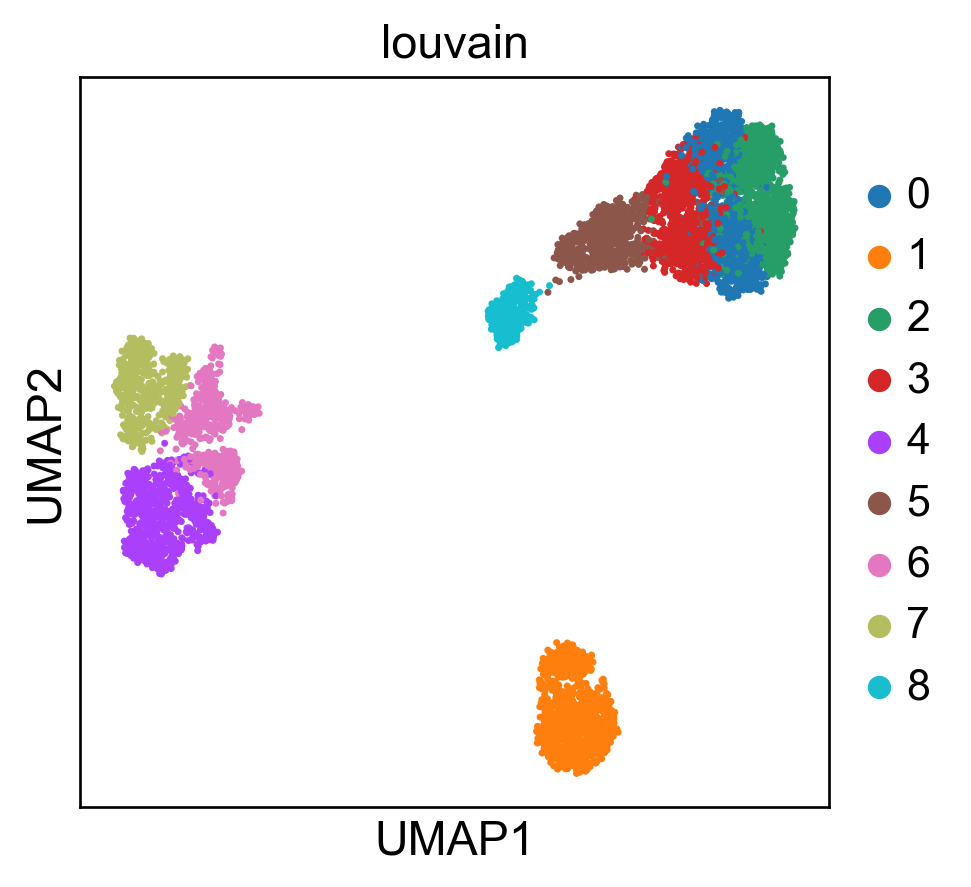

In [78]:
# Running louvain from kNN in Q3:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=20)
sc.tl.umap(adata)
sc.tl.louvain(adata)
sc.settings.set_figure_params(dpi=120)
sc.pl.umap(adata, color="louvain")

In [81]:
# So with this, I'd lke to compare to kmeans from Q2 dendro, but again, I want to ask about the parameters and if I have set them correctly with the data I have.
sc.tl.dendrogram(adata, groupby = "louvain_1.0")

genes  = ['RPS27', 'RPS6', 'RPL32', 'HLA-B', 'RPS29', 'NKG7', 'GNLY', 'LYZ', 'S100A9', 'S100A8', 'GZMA']




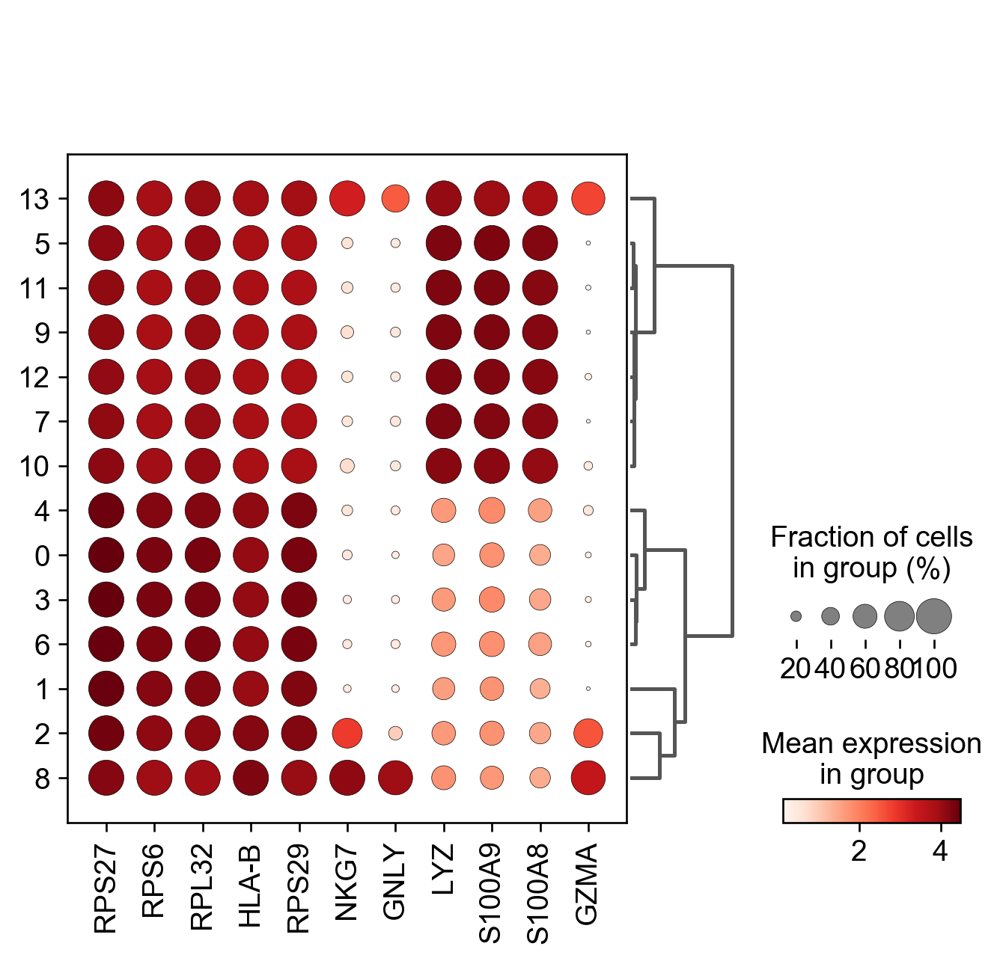

In [82]:
sc.pl.dotplot(adata, genes, groupby='louvain_1.0', dendrogram=True)

## Q5a. Perform a t-test to find differentially expressed genes (DEGs) in a cluster of your choice. Color the embedding with the expression of the top 5 DEGs [20 pts].


# How do I choose the clusters?

sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

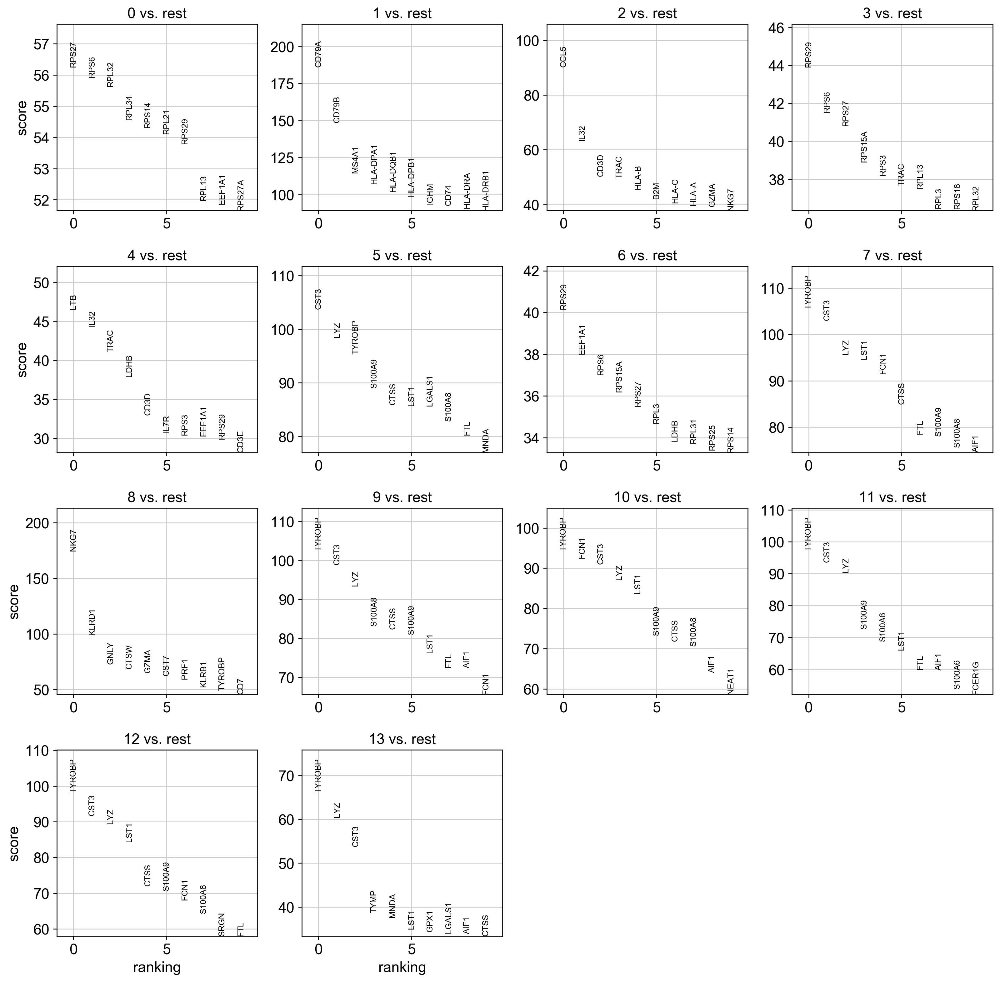

In [83]:
# Perform t-test to DE genes in each cluster
sc.tl.rank_genes_groups(adata, "louvain_1.0", method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)
# how do i see the pvalues

In [84]:
sc.settings.verbosity = 2  # reduce the verbosity

In [85]:
# Top 10 DE Genes for each cluster from cluster 0 to 10
# Each column represents each cluster
de_genes = pd.DataFrame(adata.uns['rank_genes_groups']['names'])

de_genes.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,RPS27,CD79A,CCL5,RPS29,LTB,CST3,RPS29,TYROBP,NKG7,TYROBP,TYROBP,TYROBP,TYROBP,TYROBP
1,RPS6,CD79B,IL32,RPS6,IL32,LYZ,EEF1A1,CST3,KLRD1,CST3,FCN1,CST3,CST3,LYZ
2,RPL32,MS4A1,CD3D,RPS27,TRAC,TYROBP,RPS6,LYZ,GNLY,LYZ,CST3,LYZ,LYZ,CST3
3,RPL34,HLA-DPA1,TRAC,RPS15A,LDHB,S100A9,RPS15A,LST1,CTSW,S100A8,LYZ,S100A9,LST1,TYMP
4,RPS14,HLA-DQB1,HLA-B,RPS3,CD3D,CTSS,RPS27,FCN1,GZMA,CTSS,LST1,S100A8,CTSS,MNDA
5,RPL21,HLA-DPB1,B2M,TRAC,IL7R,LST1,RPL3,CTSS,CST7,S100A9,S100A9,LST1,S100A9,LST1
6,RPS29,IGHM,HLA-C,RPL13,RPS3,LGALS1,LDHB,FTL,PRF1,LST1,CTSS,FTL,FCN1,GPX1
7,RPL13,CD74,HLA-A,RPL3,EEF1A1,S100A8,RPL31,S100A9,KLRB1,FTL,S100A8,AIF1,S100A8,LGALS1
8,EEF1A1,HLA-DRA,GZMA,RPS18,RPS29,FTL,RPS25,S100A8,TYROBP,AIF1,AIF1,S100A6,SRGN,AIF1
9,RPS27A,HLA-DRB1,NKG7,RPL32,CD3E,MNDA,RPS14,AIF1,CD7,FCN1,NEAT1,FCER1G,FTL,CTSS


In [86]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,9_n,9_p,10_n,10_p,11_n,11_p,12_n,12_p,13_n,13_p
0,RPS27,0.0,CD79A,0.0,CCL5,0.000000e+00,RPS29,7.245967e-319,LTB,0.000000e+00,...,TYROBP,0.0,TYROBP,0.0,TYROBP,0.000000e+00,TYROBP,0.0,TYROBP,1.339062e-107
1,RPS6,0.0,CD79B,0.0,IL32,0.000000e+00,RPS6,1.424554e-264,IL32,1.687718e-283,...,CST3,0.0,FCN1,0.0,CST3,0.000000e+00,CST3,0.0,LYZ,2.929946e-105
2,RPL32,0.0,MS4A1,0.0,CD3D,0.000000e+00,RPS27,7.406517e-264,TRAC,4.022357e-253,...,LYZ,0.0,CST3,0.0,LYZ,0.000000e+00,LYZ,0.0,CST3,1.025281e-67
3,RPL34,0.0,HLA-DPA1,0.0,TRAC,0.000000e+00,RPS15A,8.871185e-231,LDHB,4.592713e-227,...,S100A8,0.0,LYZ,0.0,S100A9,0.000000e+00,LST1,0.0,TYMP,8.334373e-40
4,RPS14,0.0,HLA-DQB1,0.0,HLA-B,7.415351e-289,RPS3,3.278064e-252,CD3D,2.374737e-170,...,CTSS,0.0,LST1,0.0,S100A8,1.455355e-290,CTSS,0.0,MNDA,2.683550e-37


## Q5b. How would you characterize the cluster [5 pts]?

* sigmoid, would be better with log regression, but look at Wilcoxon ranking and log reg too.



# Q5c. Which other differential expression method might be appropriate for the expression distribution in this data? [bonus 15pt]

# Is the result similar if you use
* wilcoxon
* logregression



ranking genes
    finished (0:00:02)


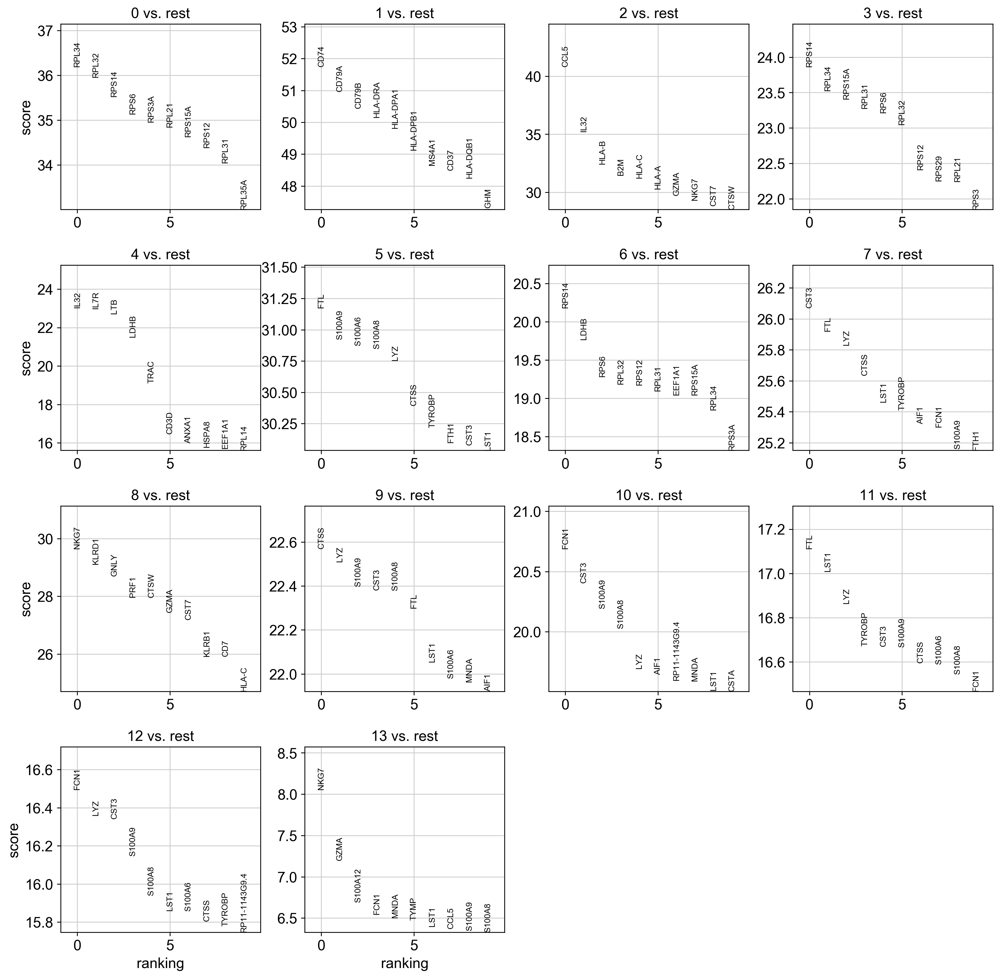

In [94]:
# Wilcoxon
sc.tl.rank_genes_groups(adata, 'louvain_1.0', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

ranking genes
    finished (0:00:02)


/Users/kathrynwhyte/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


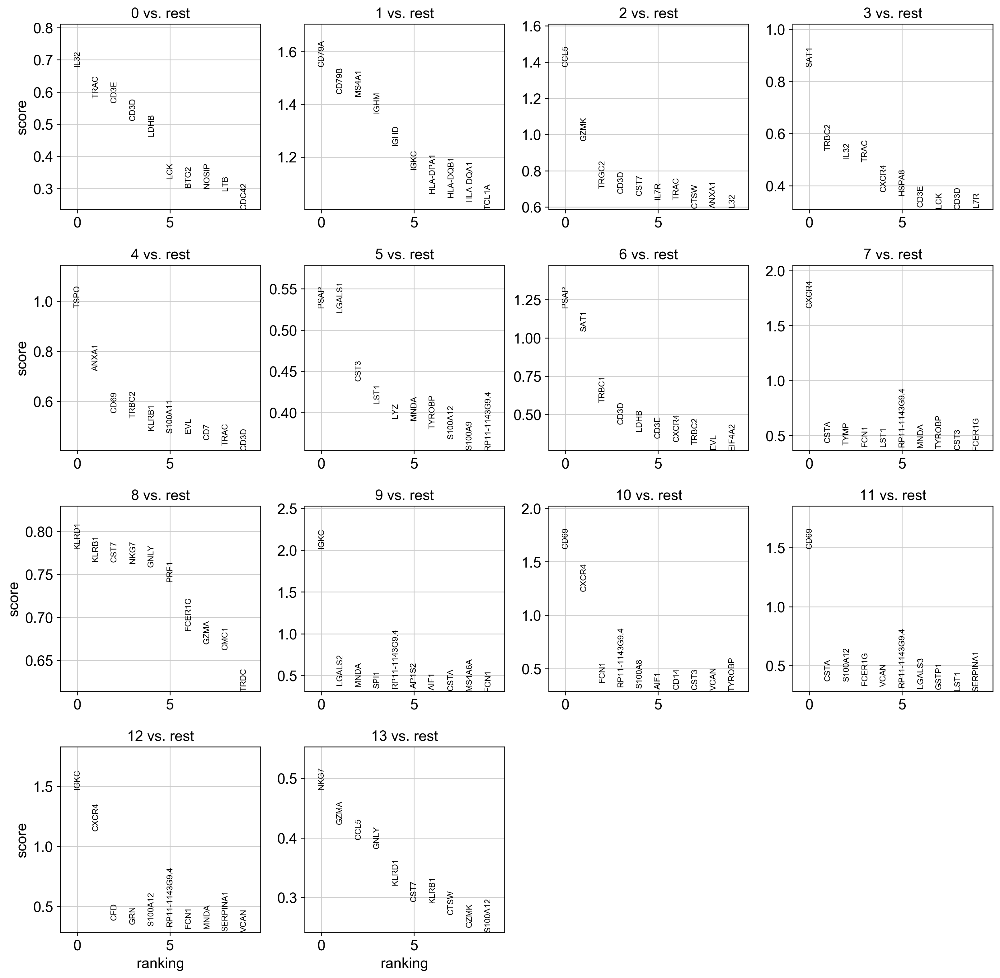

In [95]:
# log regression
sc.tl.rank_genes_groups(adata, 'louvain_1.0', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

## Q5c 
* Logistic regressiom better fits the distributon and shape of the data

# Q6. Solve problem 9.4 of the PRML textbook (pg 456) [10 pts].

9.4 () Suppose we wish to use the EM algorithm to maximize the posterior distribution
over parameters p(θ|X) for a model containing latent variables, where X is
the observed data set. Show that the E step remains the same as in the maximum
likelihood case, whereas in the M step the quantity to be maximized is given by
Q(θ, θold) + lnp(θ) where Q(θ, θold) is defined by (9.30).


